<div class="alert alert-block alert-info" >
    <h1>Robot Perception</h1>
    <h3>General Information:</h3>
    <p>Please do not add or delete any cells. Answers belong into the corresponding cells (below the question). If a function is given (either as a signature or a full function), you should not change the name, arguments or return value of the function.<br><br> If you encounter empty cells underneath the answer that can not be edited, please ignore them, they are for testing purposes.<br><br>When editing an assignment there can be the case that there are variables in the kernel. To make sure your assignment works, please restart the kernel and run all cells before submitting (e.g. via <i>Kernel -> Restart & Run All</i>).</p>
    <p>Code cells where you are supposed to give your answer often include the line  ```raise NotImplementedError```. This makes it easier to automatically grade answers. If you edit the cell please outcomment or delete this line. </p>
    <br>The server resource is limited to 2 core cpu and 1GB RAM at max per user. If you use more than that, the kernel may die. Nevertheless, you can bring it up again by restaring the kernel (Kernel -> Restart and clear output).<br>
    <h3>Submission:</h3>
    <p>Upload all attachments required to run the notebook and provide a correct path to them.</p>
    <p><strike>Please submit your notebook via the web interface (in the main view -> Assignments -> Submit)</strike>.</p> 
    <p>Starting from RP-HW07 onwards, submit the notebook and pdf version of it via LEA.</p>
    <p>The assignments are due on <b>Monday at 0:00.</b> (i.e. Sunday 23:59 + 1 min)</p>
    <h3>Group Work:</h3>
    <p>You are allowed to work in groups of up to two people. Please enter the UID (your username here) of each member of the group into the next cell. We apply plagiarism checking, so do not submit solutions from other people except your team members. If an assignment has a copied solution, the task will be graded with 0 points for all people with the same solution.</p>
    <p><b>YOU SHOULD ONLY SUBMIT EXACTLY ONE PER GROUP</b></p>
    <h3>Questions about the Assignment:</h3>
    <p>If you have questions about the assignment please post them in the LEA forum before the deadline. Don't wait until the last day to post questions.</p></div>

<div class="alert alert-block alert-danger">
<p><b>Put your answer in the PROVIDED CELLS only!</b></p>
<b>Any new cell is not visible during the grading.</b>
<p>We provide additional code and markdown cells for each question, so that you do not have to add the new ones.</p>
<p>Do not copy the metadata from one cell to another as it is unique to that cell only.</p></div>

In [ ]:
'''
Group Work:
Enter the UID (i.e. student2s) of each team member into the variables. 
If you work alone please leave the second variable empty, or extend this list if necessary.
'''
member1 = 'mmulye2s'
member2 = ''


## Q&As: Pose three questions (and ans.) to last lecture, 3 Q&As per member [1 point]

The format of the question and answer should be [Q1,A1,Q2,A2,Q3,A3,...,Qn,An], where Q1 is the question and A1 is the answer.<br>
If you work in a group, the total of the Q&As is $3xn$, where $n$ is the total number of members.<br>

Put your answer in the provided cell below!<br>
If you work in a group, you can extend the provided Q&A template, but please use the same format:
1. Q and A are separated by ONE $<$br$>$
2. Q&A and other Q&As are separated by TWO $<$br$>$

Or copy the provided format in the answer cell, and change the Q&A number.
<br>
Do not remove any markdown tag like $<$br$>$ in the answer cell.

YOUR ANSWER HERE
<br>
Q1 = Describe $SIFT$ briefly.
<br>
A1 = $SIFT$ stands for Scale Invariant Feature Transform. It makes use of feature points with vector of attributes which are scale and rotation (in plane) invariant. Following are the steps of $SIFT$: <br> 
(i) Scale the space and compute the difference of gaussian on every scale. Detect edges  <br>
(ii) Identify key points (those which are stable to scale, rotation and other disturbances) <br> 
(iii) Assign descriptors to the obtained keypoints in step ii <br> 
(iv) Match the keypoints in the images used for training 
<br>
<br>
Q2 = List the steps to reconstruct $3D$ scenes from a pair of $2D$ images. 
<br>
A2 = 
<br> (i) Compute $F$ from point correspondeces <br> 
(ii) Compute $P'$ and $P$ from the fundamental matrix ($F$) <br> 
(iii) For all point correspondences, $x_{i}$ ⟷ $x'_{i}$, traingulate to compute the point is space projecting to the considered two points. 
<br>
<br>
Q3 = State the projective reconstruction theorem .
<br>
A3 = If a set of point correspondences in 2 views generate a unique fundamental matrix, then the scene and cameras may be reconstructed from these point correspondences and any 2 such reconstructions from these correspondences are equivalent projectively. 


References: <br> 
(i) Lecture slides <br> 
(ii) Multi View Geometry Book Hartley Zisserman 

In [ ]:
'''
Provide the time required to solve the assignment per task as well as the sum (in minutes).
Extend this list if needed.
'''

Task1 = 240
Task2 = 120
Task3 = 180
Sum = 540


## Task1: CameraCalibration using SURF and automatic point pairs

#### Your tasks are:

a. Run Feature extraction (SURF or SIFT) on `images/20150616_074411.jpg` and `images/20150616_07444.jpg`, display the found features. 

`NOTE: both images have lens distortion, thus they are NOT calibrated.`

b. Run features MATCHING on those point sets, filter out only the "good" ones!

c. Use the match point set to run a camera Calibration and find the intrinsic parameters. Undistort the images. compare to the included files `*Calibrated.jpg`

d. I produced some point correspondences by hand myself see files (`shelf0Points.csv and shelfrrPoints.csv`). Redo Calibration using THESE point correspondences. Compare the results!

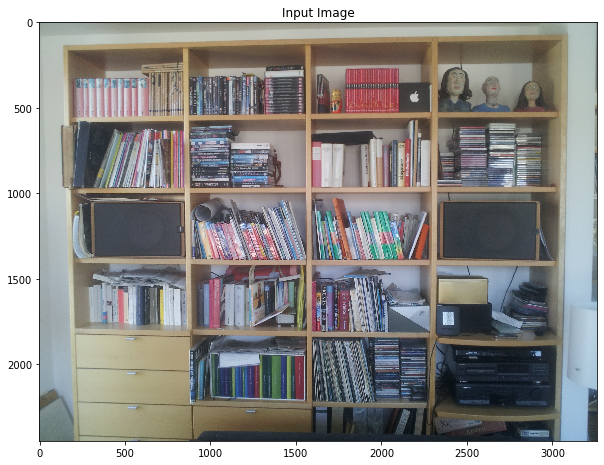

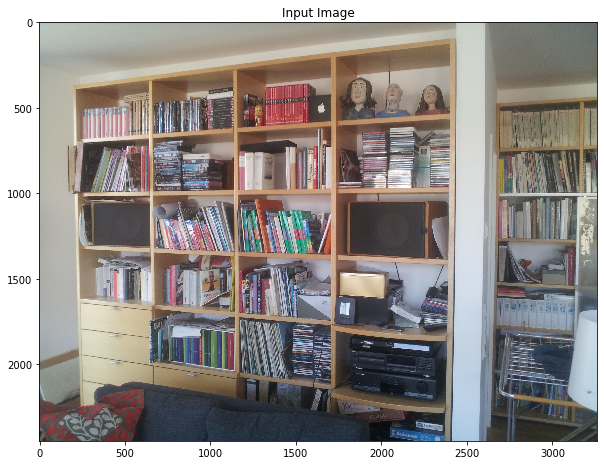

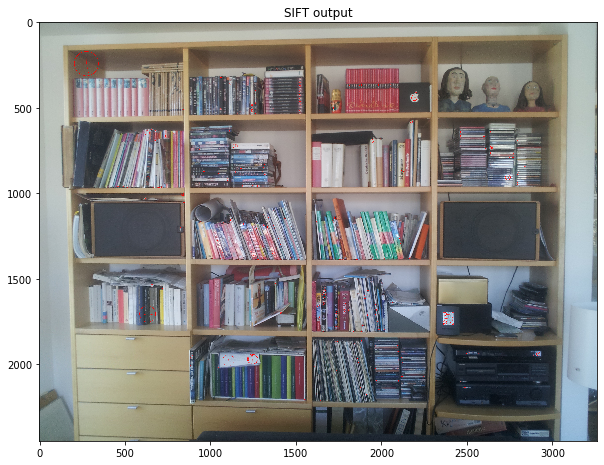

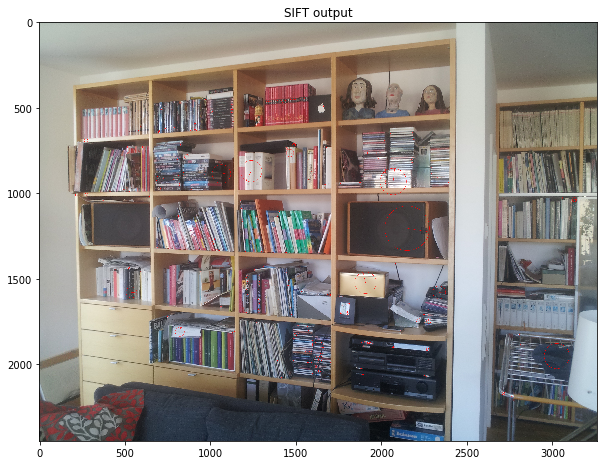

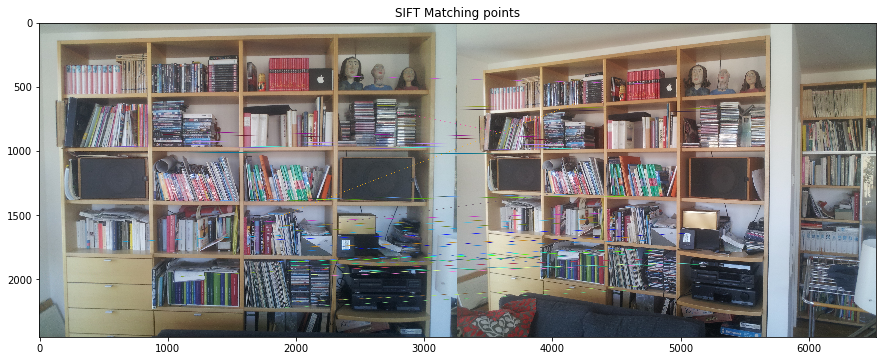

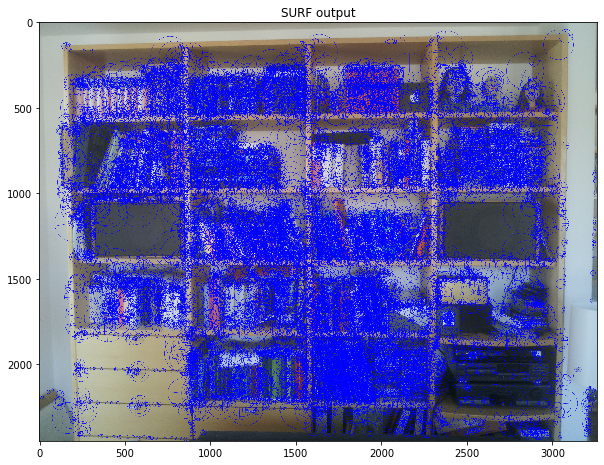

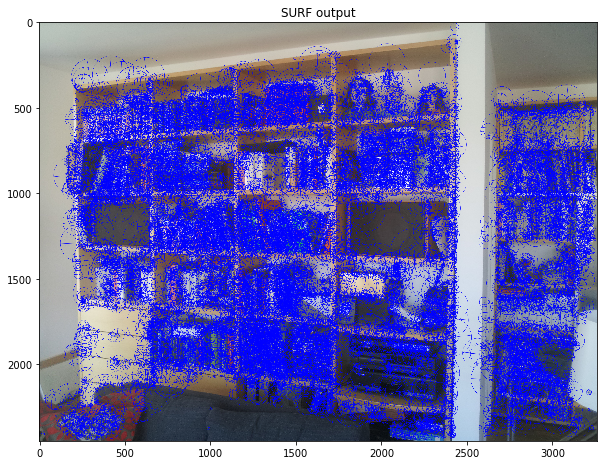

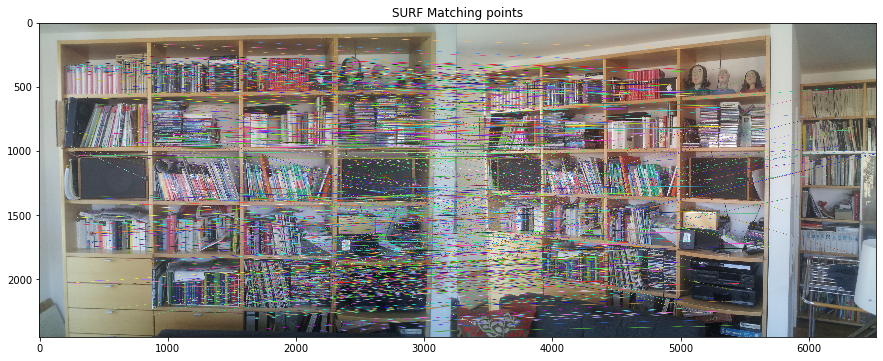

In [2]:
# YOUR CODE HERE
#raise NotImplementedError()


#(a) run feature extraction and filter "good" matching points
import cv2 as cv2 
import matplotlib.pyplot as plt 
import numpy as np 

%matplotlib inline

def readImage(filename):
    img = cv2.imread(filename)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.title('Input Image')
    return img 


def runSIFT(filename):
    filename= cv2.cvtColor(filename,cv2.COLOR_BGR2RGB)
    sift = cv2.xfeatures2d.SIFT_create(500)
    kp, des = sift.detectAndCompute(filename,None)
    img = cv2.drawKeypoints(filename,kp,None,(0,0,255),4)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.title('SIFT output')
    return kp, des


def runSURF(filename):
    filename= cv2.cvtColor(filename,cv2.COLOR_BGR2RGB)
    surf =  cv2.xfeatures2d.SURF_create(200)
    kp, des = surf.detectAndCompute(filename,None)
    img = cv2.drawKeypoints(filename,kp,None,(255,0,0),4)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.title('SURF output')
    return kp, des  


def featureMatching(img1, img2, kp1, kp2, des1, des2, algo):
    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matchingPoints = bf.knnMatch(des1,des2, k=2)   #len(matchingPoints) = 26219 
    
    # Apply ratio test
    goodMatches = []
    pt1 = []
    pt2 = [] 
    for i, (m1,m2) in enumerate(matchingPoints):
        if m1.distance < 0.7* m2.distance:
            ## Notice: How to get the index
            goodMatches.append([m1])
            pt1.append(kp1[m1.queryIdx].pt)
            pt2.append(kp2[m2.trainIdx].pt)
            
    #cv2.drawMatchesKnn expects list of lists as matches.
    img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,goodMatches,None,flags=2)
    plt.figure(figsize=(15,15))
    plt.imshow(img3)
    plt.title(str(algo)+' Matching points')
    plt.show()
    
    pt1len = len(pt1)
    pt1 = np.array(pt1)
        
    pt2len = len(pt2)
    pt2 = np.array(pt2)
    
    return goodMatches, pt1, pt2 


img1 = readImage('images/20150616_074411.jpg')
img2 = readImage('images/20150616_074444.jpg')


#processing SIFT
kpSIFT1, desSIFT1 = runSIFT(img1)
kpSIFT2, desSIFT2 = runSIFT(img2) 
matchingPointsSIFT, imgPtsSIFT1, imgPtsSIFT2 = featureMatching(img1, img2, kpSIFT1, kpSIFT2, desSIFT1, desSIFT2, 'SIFT')


#processing SURF
kpSURF1, desSURF1 = runSURF(img1)
kpSURF2, desSURF2 = runSURF(img2) 
matchingPointsSURF, imgPtsSURF1, imgPtsSURF2 = featureMatching(img1, img2, kpSURF1, kpSURF2, desSURF1, desSURF2, 'SURF')


#understanding queryIdx and trainIdx better: 
# https://stackoverflow.com/questions/13318853/opencv-drawmatches-queryidx-and-trainidx#:~:text=queryIdx%3A%20This%20attribute%20gives%20us,index%20of%20the%20train%20image.

K matrix is: 
 [[ 282.94319611    0.         1653.66530101]
 [   0.          382.62083154 1195.13626474]
 [   0.            0.            1.        ]]
Camera matrix (focal length in pixels) using SIFT: 
 [[ 447.27410889    0.          886.04108151]
 [   0.          442.78668213 1223.39184326]
 [   0.            0.            1.        ]]
distortion coefficients using SIFT are: 
 [[ 0.02788763  0.00013346  0.00288014 -0.04175796 -0.00000701]]
P Matrix using SIFT points: 
 [[1190.47974146 -552.73135559 1044.94584247   -2.15305939]
 [1140.47073639 -232.30318011  469.1600196    -3.72889769]
 [   0.75137445   -0.16619848    0.63860355   -4.70798544]]


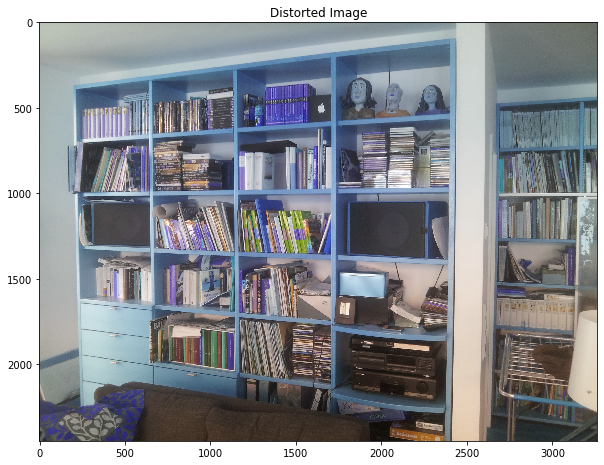

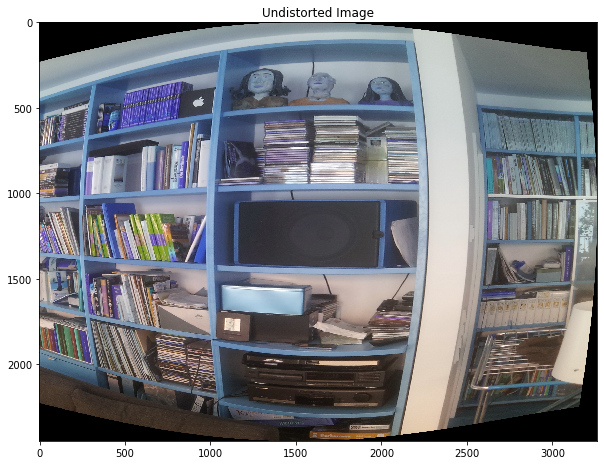

In [3]:
# YOUR CODE HERE
#raise NotImplementedError()
np.set_printoptions(suppress=True)

def cameraCalibration(filename, pc1, pc2):
    pointPattern = (2,int(pc1.shape[0]/2))

    # Creating vector to store vectors of 3D points for each image
    objpoints = []
    # Creating vector to store vectors of 2D points for each image
    imgpoints = []

    objp = np.zeros((1, pointPattern[0] * pointPattern[1], 3), np.float32)
    objp[0,:,:2] = np.mgrid[0:pointPattern[0], 0:pointPattern[1]].T.reshape(-1, 2)

    # Extracting path of individual image stored in a given directory
    images = ['images/20150616_074411.jpg','images/20150616_074444.jpg']
    counter = 0 
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        objpoints.append(objp)
        if counter == 0:
            imgpoints.append(pc1.reshape(-1,2).astype('float32'))
        elif counter == 1 : 
            imgpoints.append(pc2.reshape(-1,2).astype('float32'))
        counter = counter + 1 

    
    inputImage = cv2.imread('images/20150616_074444.jpg')
    plt.figure(figsize=(10,10))
    plt.imshow(inputImage)
    plt.title('Distorted Image') 
    
    grayinputImage =  cv2.cvtColor(inputImage,cv2.COLOR_BGR2GRAY)
    h, w = inputImage.shape[:2]

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, grayinputImage.shape[::-1], None, None)
    print('K matrix is: \n',mtx) 
    newCameraMatrix, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))
    undistortedImg = cv2.undistort(inputImage, mtx, dist, None, newCameraMatrix)
    plt.figure(figsize=(10,10))
    plt.imshow(undistortedImg)
    plt.title('Undistorted Image')
    
    rvecs = np.asarray(rvecs)
    rvecs = np.mean(rvecs, axis=0).T

    rotation_mat = np.zeros(shape=(3, 3))
    R = cv2.Rodrigues(rvecs, rotation_mat)[0]
    P = np.column_stack((np.matmul(mtx,R), tvecs[0]))
    
    return newCameraMatrix, dist, P


#computing camera intrinsic parameters using SIFT 
cameraIntrinsicParametersSIFT, distortionCoefficientsSIFT, PSIFT= cameraCalibration('images/20150616_074411.jpg',imgPtsSIFT1,imgPtsSIFT2)
print("Camera matrix (focal length in pixels) using SIFT: \n", cameraIntrinsicParametersSIFT)
print("distortion coefficients using SIFT are: \n", distortionCoefficientsSIFT)
print("P Matrix using SIFT points: \n",PSIFT)


K matrix is: 
 [[ 647.47859721    0.         1626.97424462]
 [   0.          562.22483829 1203.55586826]
 [   0.            0.            1.        ]]
Camera matrix (focal length in pixels) : 
 [[  13.96840668    0.         2464.70400147]
 [   0.           11.68882942  225.7531147 ]
 [   0.            0.            1.        ]]
distortion coefficients are: 
 [[-0.01404193 -0.00122602 -0.01894116  0.02002692  0.00001636]]
P matrix using given points: 
 [[-854.903672     86.73515801 1525.74258985    1.04479351]
 [-203.65572528  665.55147868 1131.46324359   -1.28964482]
 [  -0.55587937    0.39291119    0.73254278    1.4757437 ]]


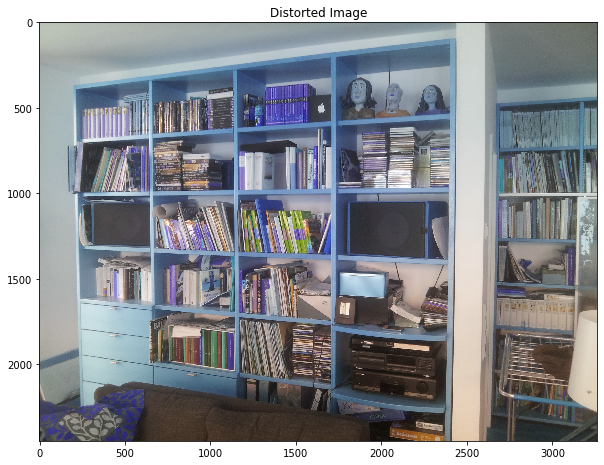

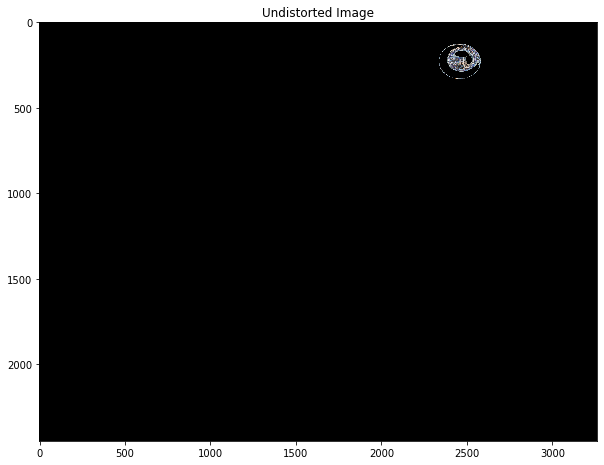

In [4]:
###### YOUR CODE HERE
#raise NotImplementedError()

#(d) run camera calibration using given points 

np.set_printoptions(suppress=True)

# extract points 
def dataLoader(filename):
    givenPoints = [] 
    with open(filename, "r") as filestream:
        next(filestream)
        for line in filestream:
            currentline = line.split(",")
            givenPoints.append([float(x) for x in currentline[1:]])
            #print(givenPoints)
    givenPoints = np.array(givenPoints)
    givenPoints = np.reshape(givenPoints, (-1,2))
    return givenPoints
    
    
#givenPtCorrespondences = dataLoader('shelf0Points.csv')
shelf0Points = dataLoader('shelf0straightwithLinesPoints.csv')
shelfrrPoints = dataLoader('shelfrrstraightwithLinesPoints.csv')


cameraIntrinsicParametersGP, distortionCoefficientsGP, PGP = cameraCalibration('images/20150616_074411.jpg',shelf0Points,shelfrrPoints)
print("Camera matrix (focal length in pixels) : \n",cameraIntrinsicParametersGP)
print("distortion coefficients are: \n",distortionCoefficientsGP)
print("P matrix using given points: \n",PGP)
    
#error resolved from 
#https://stackoverflow.com/questions/31806135/opencv-camera-calibration-in-python-without-using-cv2-findchessboardcorners

In [ ]:
# YOUR CODE HERE
#raise NotImplementedError()

The dimension of the given images is (3264x2448) pixels. This means that the K[0,2] and K[1,2] of the K matrix should roughly be equal to 1632 and 1224. These values match the ones found in K matrix found by SIFT point analysis. Interestingly, the K matrix values calculated using the data in .csv files does not agree with the SIFT values or the ideal K matrix vaules. As a result, the subsequent values of the distortion coefficients and the P matrix differ from the SIFT analysis. 

## Task2: Use some point correspondences to draw epipolar lines INTO the pictures as overlays. 

In [5]:
# YOUR CODE HERE
#raise NotImplementedError()

def drawEpiLines(im, points1, points2, F):
    #plt.figure(figsize=(10,10))
    #visualizePoints(img, points1, points2, 'Epilines')
    
    # generate coefficients of the epilines in left image 
    # corresponding points lying on the right image yield epipoles on the left image and vice versa 
    epilinesImageL = np.dot(points2, F)
    epilinesImageR = np.dot(F, points1.T).T
    
    #print(epilinesImageL)
    #print(epilinesImageR)
    iml = cv2.imread('images/20150616_074411.jpg')
    imr = cv2.imread('images/20150616_074444.jpg')
    
    plt.figure(figsize=(15,15))
    #plotting epipoles on left image 
    for values in range(epilinesImageL.shape[0]):
        x_valsL = np.linspace(-1000, 1800, 61)
        x_valsL = x_valsL[:,np.newaxis].T
        y_valsL = (-epilinesImageL[values][2] - epilinesImageL[values][0]*x_valsL)/epilinesImageL[values][1]
        x_valsL = list(np.squeeze(x_valsL.T))
        y_valsL = list(np.squeeze(y_valsL.T))
        
        
        #plot lplt.imshow(img)
        plt.imshow(iml,aspect='auto',alpha=0.55)
        ax = plt.gca()                            # get the axis
        ax.set_ylim(ax.get_ylim()[::-1])        # invert the axis
        plt.xticks(rotation=45)
        ax.xaxis.tick_top()                     # and move the X-Axis  
        ax.xaxis.set_ticks(np.arange(-0, 3300, 1000))
        ax.yaxis.set_ticks(np.arange(-0, 2500, 100)) # set y-ticks
        ax.yaxis.tick_left()  
        
        plt.plot(x_valsL,y_valsL)
    
    plt.grid()
    plt.title('Epipolar lines on the left image')
    plt.tight_layout()
    plt.show()
    
    
    plt.figure(figsize=(15,15))
    #plotting epipoles on right image 
    for values in range(epilinesImageR.shape[0]):
        x_valsR = np.linspace(-0, 4100, 61)
        x_valsR = x_valsR[:,np.newaxis].T
        y_valsR = (-epilinesImageR[values][2] - epilinesImageR[values][0]*x_valsR)/epilinesImageR[values][1]
        x_valsR = list(np.squeeze(x_valsR.T))
        y_valsR = list(np.squeeze(y_valsR.T))
        
        
        #plot lplt.imshow(img)
        plt.imshow(imr,aspect='auto',alpha=0.15)
        ax = plt.gca()                            # get the axis
        ax.set_ylim(ax.get_ylim()[::-1])        # invert the axis
        plt.xticks(rotation=45)
        ax.xaxis.tick_top()                     # and move the X-Axis  
        ax.xaxis.set_ticks(np.arange(0, 4200, 1000))
        ax.yaxis.set_ticks(np.arange(-0, 2500, 100)) # set y-ticks
        ax.yaxis.tick_left()
        
        plt.plot(x_valsR,y_valsR)
        
    plt.grid()
    plt.title('Epipolar lines on the right image')
    plt.tight_layout() 
    #plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    plt.show()    

(52, 3)
(52, 3)
FSIFT is: 
 [[-0.00000047 -0.00000081  0.00252142]
 [ 0.0000006   0.0000008  -0.00268873]
 [-0.00037335 -0.00020583  1.        ]]
Epipoles for SIFT analysis: 
 [1411.56960248 2297.95012793    1.        ] [1628.51653834 1899.10434604    1.        ]
(10, 3)
(10, 3)
FGP is: 
 [[-0.0000912  -0.00024858 -0.0826421 ]
 [ 0.00015531  0.00001314  0.00822536]
 [ 0.247171   -0.01651502  1.        ]]
Epipoles for Given Points analysis: 
 [ -25.63069939 -323.04926615    1.        ] [ -155.37879056 -1682.70180894     1.        ]


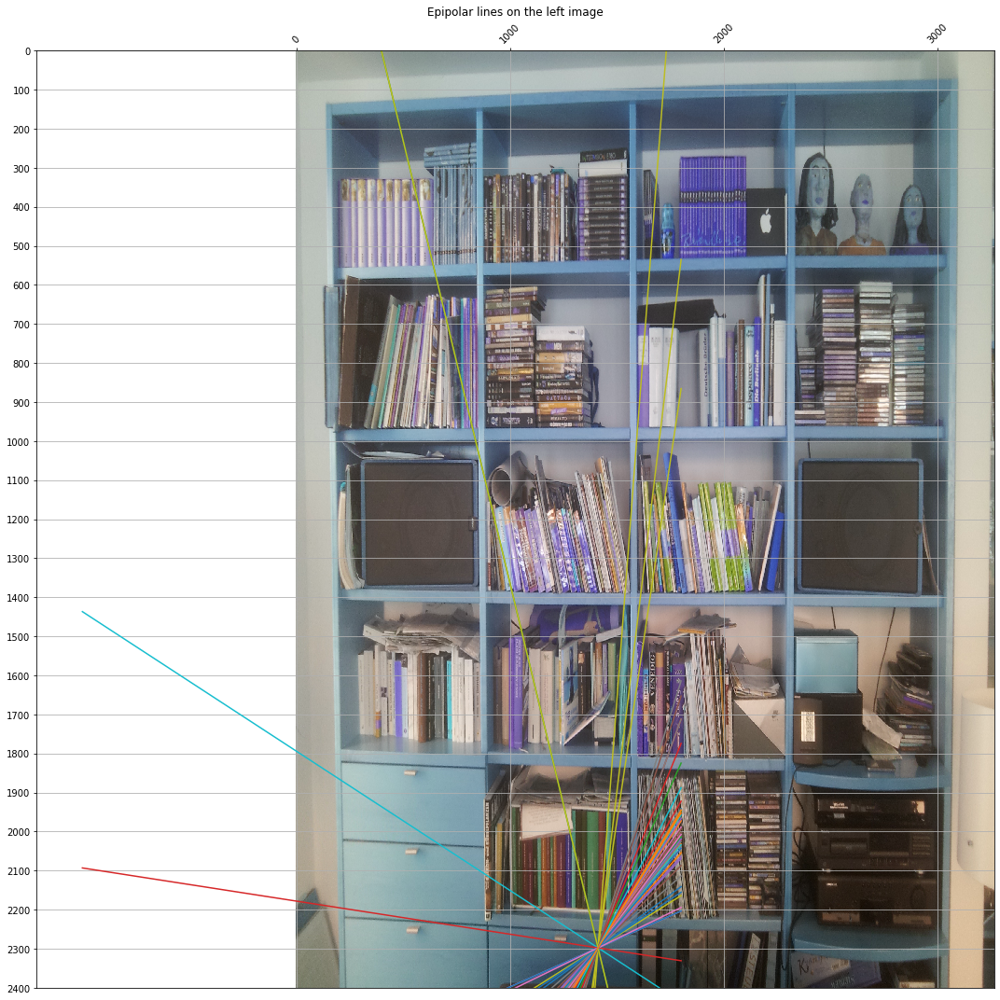

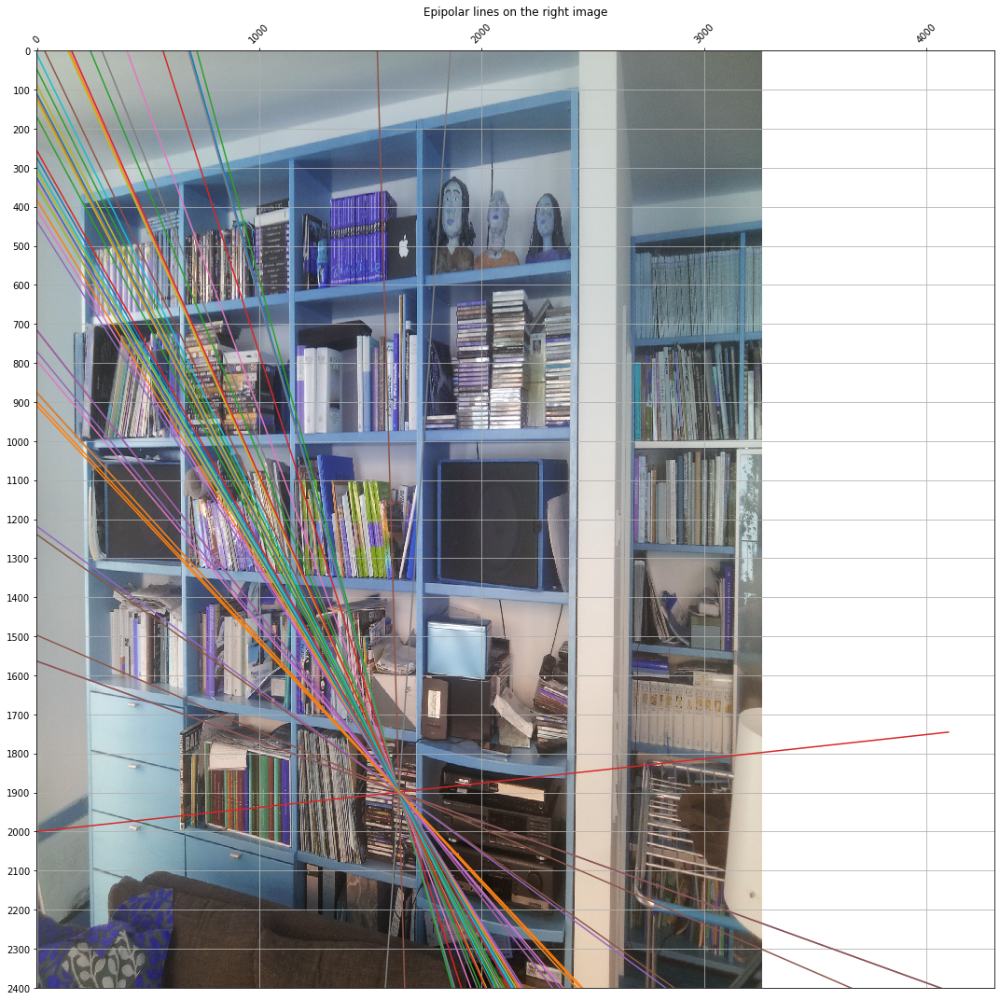

In [6]:
# YOUR CODE HERE
#raise NotImplementedError()

def estimateFundamentalMatrix(pointSet1, pointSet2):
    F = cv2.findFundamentalMat(pointSet1, pointSet2)
    return F 


def compute_epipole(F):
    """ Computes the (right) epipole from a fundamental matrix F. (Use with F.T for left epipole.) """
    # return null space of F (Fx=0)
    Ur, Sr, Vr = np.linalg.svd(F.T)
    er = Vr[-1]
    
    Ul, Sl, Vl = np.linalg.svd(F)
    el = Vl[-1]
    
    return el/el[2], er/er[2]


#SIFT analysis
#print(imgPtsSIFT1.shape)
imgPtsSIFT1 = np.hstack((imgPtsSIFT1,np.ones((imgPtsSIFT1.shape[0],1))))
imgPtsSIFT2 = np.hstack((imgPtsSIFT2,np.ones((imgPtsSIFT2.shape[0],1))))
print(imgPtsSIFT1.shape)
print(imgPtsSIFT2.shape)

FSIFT, _ = estimateFundamentalMatrix(imgPtsSIFT1, imgPtsSIFT2)
print('FSIFT is: \n',FSIFT)
epipoleFSIFTL, epipoleFSIFTR = compute_epipole(FSIFT)
print('Epipoles for SIFT analysis: \n', epipoleFSIFTL, epipoleFSIFTR)


shelf0Points = np.hstack((shelf0Points,np.ones((shelf0Points.shape[0],1))))
shelfrrPoints = np.hstack((shelfrrPoints,np.ones((shelfrrPoints.shape[0],1))))
print(shelf0Points.shape)
print(shelfrrPoints.shape)

FGP, _ = estimateFundamentalMatrix(shelf0Points, shelfrrPoints)
print('FGP is: \n',FGP)
epipoleFGPL, epipoleFGPR = compute_epipole(FGP)
print('Epipoles for Given Points analysis: \n', epipoleFGPL, epipoleFGPR)
    
im = cv2.imread('images/20150616_074411.jpg')
drawEpiLines(im, imgPtsSIFT1, imgPtsSIFT2, FSIFT)

## Task3: Given the image `shelf0CalibratedwithLines.jpg` and the points as below. 

#### Assumptions:
* The distance 11-12 is 125 cm in reality
* The horizontal line is given by points 13 and 14 which lie on the horizontal line.

#### Your tasks are:

a. Calculate (in Python) in any way you can think of the distance between 5-7 in cm! (sanity check: ground truth is 32,7cm).

b. Estimate the error (in cm).

c. Explain what mainly caused the error?.

In [ ]:
# YOUR CODE HERE
#raise NotImplementedError()

# visualizing given data 
givenImg1 = cv2.imread('images/data/shelf0straightwithLines.jpg')
givenImg2 = cv2.imread('images/data/shelfrrstraightwithLines.jpg')
givenPts1 = shelf0Points
givenPts2 = shelfrrPoints

pt11 = np.array([[65, 395]])
pt12 = np.array([[55, 85]]) 
pt13 = np.array([[255, 220]])
pt14 = np.array([[685, 220]])
pt05 = np.array([[670, 400]])
pt07 = np.array([[670, 310]]) 

pointMatrix = np.vstack((pt11, pt12, pt13, pt14, pt05, pt07))
print(pointMatrix)

plt.figure(figsize=(15,15))
#print(givenPts1[:,0])
#print(givenPts1[:,1])

plt.imshow(givenImg1, alpha=0.5)
ax = plt.gca()           # get the axis
ax.xaxis.tick_top()
#ax.set_ylim(ax.get_ylim()[::-1])  
plt.scatter(givenPts1[:,0],givenPts1[:,1])
plt.scatter(pointMatrix[:0], pointMatrix[:1])

plt.figure(figsize=(15,15))
#print(givenPts2[:,0])
#print(givenPts2[:,1])

plt.imshow(givenImg2, alpha=0.5)
ax = plt.gca()           # get the axis
ax.xaxis.tick_top()
#ax.set_ylim(ax.get_ylim()[::-1])  
plt.scatter(givenPts2[:,0],givenPts2[:,1])
#plt.scatter(pointMatrix[:0], pointMatrix[:1])


In [ ]:
# YOUR CODE HERE
#raise NotImplementedError()

In [ ]:
# YOUR CODE HERE
#raise NotImplementedError()

YOUR ANSWER HERE